### Data Augmentation with Albumentations

### 1. For Classification

In [1]:
!cp -R '../input/resources-albumentations-guide/resources_kaggle' './resources'

In [2]:
import albumentations as A        # For data augmentation
import cv2                        # For loading images
import matplotlib.pyplot as plt   # For plotting images
import numpy as np                # its obvious

In [3]:
BASE_DIR = './resources'

In [4]:
# making a function to load the image
def load_img(path):
    image = cv2.imread(path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image

In [5]:
# load the image
image = load_img(f'{BASE_DIR}/bird.jpg')
image.shape

(3335, 5000, 3)

In [6]:
# Augmentation Pipeline with Albumentations
transform = A.Compose([
    A.Blur(blur_limit=(60, 70), p=1)
])

The A.Compose() class in Albumentations is a very important class. You can give a list of Transformations in this A.Compose() and then call this pipeline whenever you want to transform images. Like this:

In [7]:
transformed_img = transform(image=image)['image']
transformed_img.shape

(3335, 5000, 3)

In my transformation/augmentation pipeline I only gave one transformation which was Blur so the `transformed_img` should be blurred version of input image.

The transformation is as follows,
```python
A.Blur(blur_limit=(60, 70), p=1)
```

The image should be blurred within the range specified by the tuple `blur_limit` which is equal to (60, 70). So a integer within this range is randomly selected and the image is blurred with that intensity.

I have set p=1, which means that the transformation will be applied by default. If p=0.5, this means that the transformation will be applied with a probability of 50%.

`transform(image=image)` will return a dictionary to get the transformed_img array we can simply write `transform(image=image)['image']`. And it will return the image array.

This is how that dictionary looks like:
```python
{'image': array([[[199, 214, 118],
                  [178, 192,  96],
                  [206, 220, 122],
                  ...,
                  [199, 215, 114],
                  [199, 217, 115],
                  [194, 210, 110]],

                 [[198, 214, 115],
                  [164, 181,  79],
                  [198, 212, 116],
                  ...,
                  [201, 217, 115],
                  [197, 215, 112],
                  [196, 212, 111]],
                 ...
```

In some more examples it will be clear to you why Albumentations return a dictionary.

In [8]:
# this function takes two image and plots it side-by-side for comparison
# [OPTIONAL: its fine if you don't see how this works as it has nothing to do with data augmentation]
def comparison(actual_image, transformed_image, titles=None):
    if titles == None:
        titles = ['Actual Image', 'Transformed Image']
        
    fig, ax = plt.subplots(1, 2, figsize=(17, 17))
    ax[0].set_title(titles[0])
    if len(actual_image.shape) == 2:
        ax[0].imshow(actual_image, cmap='gray')
    else:
        ax[0].matshow(actual_image)
    ax[0].axis('off')

    ax[1].set_title(titles[1])
    if len(transformed_image.shape) == 2:
        ax[1].imshow(transformed_image, cmap='gray')
    else:
        ax[1].matshow(transformed_image)
    ax[1].axis('off')
    plt.show()

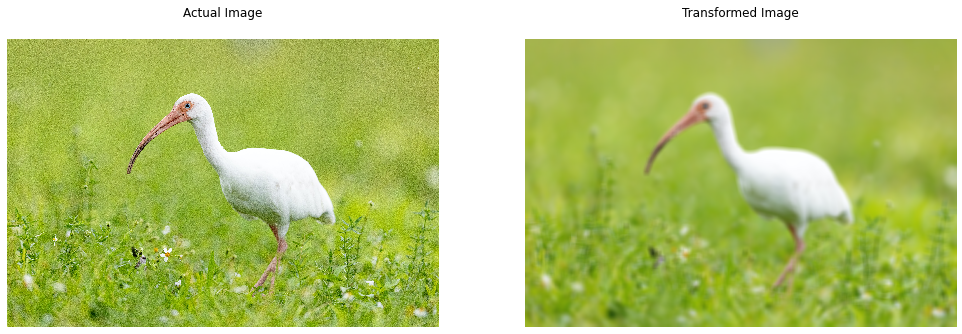

In [9]:
comparison(image, transformed_img)

As you can see the `transformed_img` is blurred

### Multiple Transformations

In [10]:
transform = A.Compose([
    A.Resize(512, 512),
    A.RandomBrightnessContrast(p=1.),
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5)
])

You can even give multiple transformation in A.Compose() with different probabilites. All of these trasnformation will be sequentially applied to the image.

<img style='width: 50%  margin-left: auto; margin-right: auto;' src='https://albumentations.ai/docs/images/getting_started/augmenting_images/augmentation_pipeline_visualized.jpg'>
<p style='text-align: center'><a href='https://albumentations.ai/docs/getting_started/image_augmentation/#step-2-define-an-augmentation-pipeline'>Credit</a></p>

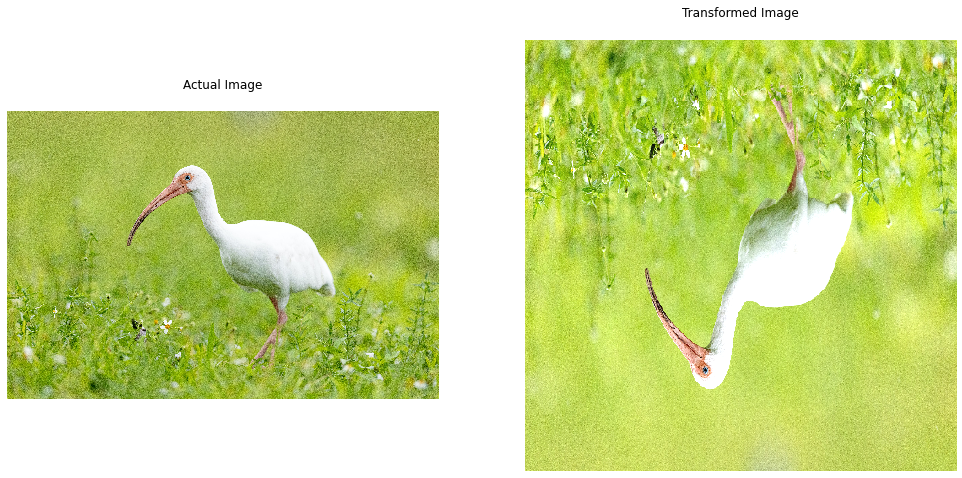

In [11]:
transformed_img = transform(image=image)['image']
comparison(image, transformed_img)

As you can see the `transformed_img` is resized. You can create augmentation pipeline by using any transformation you want.

For the list of all transformation: <a href='https://albumentations.ai/docs/getting_started/transforms_and_targets/'>Go here</a>

### 2. For Image Segmentation

<img src='https://cdn.analyticsvidhya.com/wp-content/uploads/2019/03/image-segmentation.png'>
<p style='text-align: center'><a href='https://www.analyticsvidhya.com/blog/2019/04/introduction-image-segmentation-techniques-python/'>Credit</a></p>

Image Segmentation is the task of assigning each pixel in an image to a certain class. In the above image, humans and cars are segmented. You can use image segmentation to extract objects from an image, for example what <a href='https://www.remove.bg/'>remove.bg</a> does!

Doing data augmentation for image segmentation is not as easy as for classification, because you have two images: the actual image and the mask image. The mask image has the class of every pixel of the actual image, so they both have the same number of dimensions. If you are doing a transformation on the actual image, you have to do that exact transformation on the mask image as well. So if you are using TensorFlow or any other package for data augmentation, it is not easy to do that. In addition, there might be more than one mask, so the problem gets even harder. But Albumentations makes this process easier and faster! Let's see how to do augmentation for image segmentation in Albumentations.

In [12]:
image = load_img(f'{BASE_DIR}/building.jpg')                             # load the actual image
mask = cv2.imread(f'{BASE_DIR}/building_mask.tif', cv2.IMREAD_GRAYSCALE) # load the mask image
print(image.shape, mask.shape)

(5000, 5000, 3) (5000, 5000)


During classification, we gave image to the `transform` like this,

```python
transformed_img = transform(image=image)['image']
```

For image augmentation we simply have to give `mask=mask_image` to the `transform` and it's done! Like this:

In [13]:
transformed = transform(image=image, mask=mask)

This `transformed` is a dictionary containing two keywords the image and the mask! We can get that like this:

In [14]:
transformed_img = transformed['image']
transformed_mask = transformed['mask']

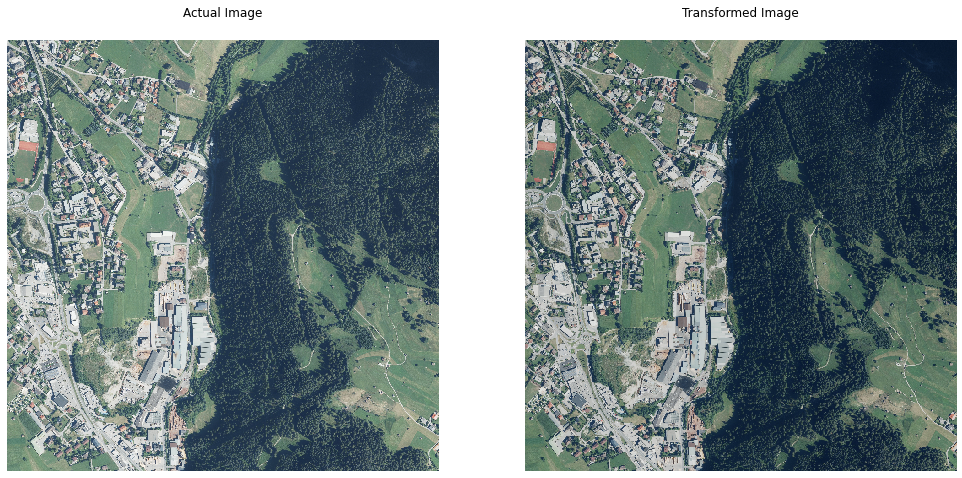

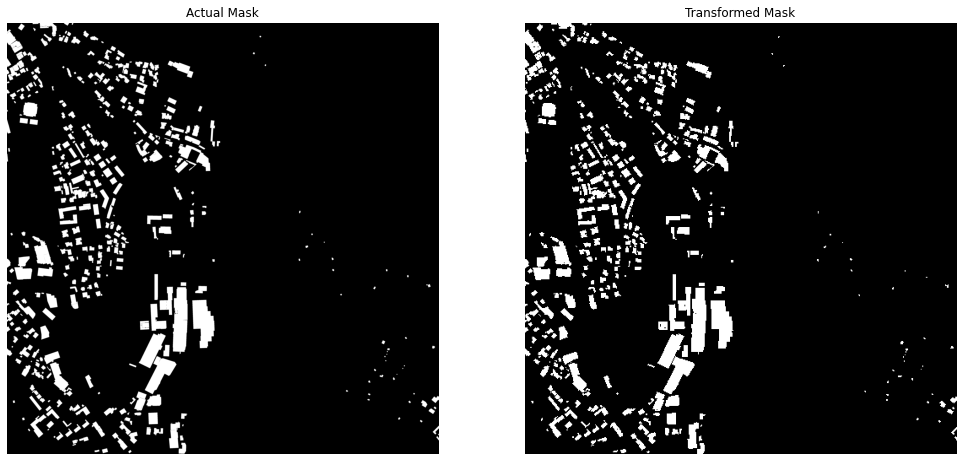

In [15]:
comparison(image, transformed_img)
comparison(mask, transformed_mask, titles=['Actual Mask', 'Transformed Mask'])

From the above plot you can see that mask image is transformed exactly the same way as actual image!

If you want to give multiple masks:
```python
mask_1 = cv2.imread("/path/to/mask_1.png")
mask_2 = cv2.imread("/path/to/mask_2.png")
mask_3 = cv2.imread("/path/to/mask_3.png")
masks = [mask_1, mask_2, mask_3]

transformed = transform(image=image, masks=masks)
transformed_image = transformed['image']
transformed_masks = transformed['masks']
```

For more information: <a href='https://albumentations.ai/docs/getting_started/mask_augmentation/#steps-1-and-2-import-the-required-libraries-and-define-an-augmentation-pipeline'>Click Here</a>

# 3. For Object Detection 

- Types of Bounding box formats

<table>
    <tr>
        <th>Name</th>
        <th>Format</th>
    </tr>
    <tr>
        <td>pascal_voc</td>
        <td>[x_min, y_min, x_max, y_max]</td>
    </tr>
    <tr>
        <td>coco</td>
        <td>[x_min, y_min, width, height]</td>
    </tr>
    <tr>
        <td>yolo</td>
        <td>[x_center, y_center, width, height]</td>
    </tr>
    <tr>
        <td>albumentations</td>
        <td>normalized [x_min, y_min, x_max, y_max]</td>
    </tr>
</table>

In [16]:
# function to convert coco to pascal_voc format
def coco2voc(coco):
    voc = []
    x, y, w, h = coco
    voc = [x, y, x+w, y+h]
    return tuple(voc)

In [17]:
# bounding boxes
coco_bb = [[628, 321, 42, 47],
           [893, 497, 65, 61],
           [853, 413, 49, 44],
           [749, 666, 57, 53],
           [625, 669, 57, 48],
           [402, 162, 46, 48],
           [687, 159, 38, 39],
           [639, 65, 44, 32],
           [614, 72, 40, 33],
           [830, 164, 56, 50],
           [537, 154, 26, 25],
           [357, 85, 33, 25],
           [405, 323, 28, 30],
           [677, 69, 46, 31],
           [314, 105, 24, 21],
           [650, 356, 27, 42],
           [1129, 689, 59, 30],
           [1140, 674, 69, 36]]

In [18]:
# Converting coco format to voc format to plot the images. It is easier to plot with cv2 when the bb is in voc format!
voc_bb = [coco2voc(i) for i in coco_bb]

In [19]:
def get_image_with_bb(image, bbs):
    # Plotting bboxes in the image
    image_with_bb = image.copy()
    for bb in bbs:
        cv2.rectangle(image_with_bb, tuple(bb[:2]), tuple(bb[2:]), (255, 0, 0), 2)
    return image_with_bb

In [20]:
image = load_img(f'{BASE_DIR}/cots.jpg')
image.shape

(720, 1280, 3)

I have taken an image from the latest <a href='https://www.kaggle.com/competitions/tensorflow-great-barrier-reef'>TensorFlow object detection competition</a>. For those who don't know, we have to detect COTS (Crown of thorns starfish) from underwater image data! This is how it looks like:

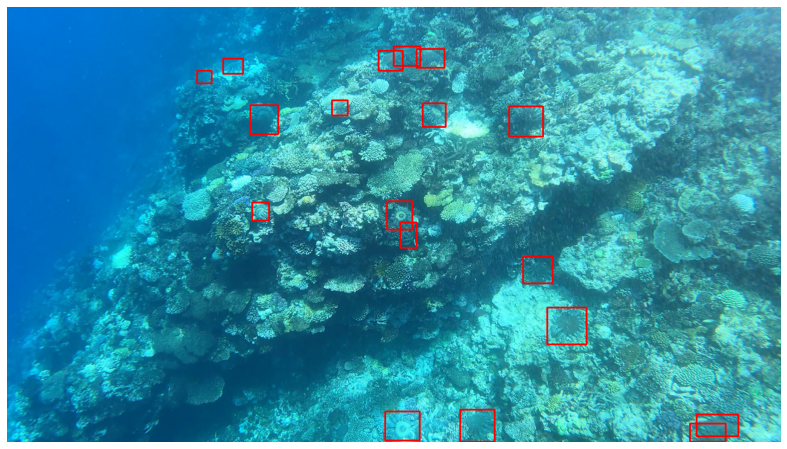

In [21]:
# Let's plot the image with bboxes
image_with_bb = get_image_with_bb(image, voc_bb)
plt.figure(figsize=(14, 8))
plt.imshow(image_with_bb)
plt.axis('off')
plt.show()

In [22]:
# Augmentation Pipeline with bbox_params
transform = A.Compose([
    A.RandomCrop(width=450, height=450),
    A.HorizontalFlip(p=0.5),
    A.HorizontalFlip(p=0.4),
    A.RandomBrightnessContrast(p=0.2),
], bbox_params=A.BboxParams(format='coco', label_fields=['class_labels']))

# You can pick any format from voc, yolo, coco & albumentations! 

As you can see the `transform` is exactly the same as previously only thing which you have to add after transformation list is 
```python
transform = A.Compose([
    any,
    transformations,
    ...
], bbox_params=A.BboxParams(format='coco', label_fields=['class_labels']))
```

In the `BboxParams`, I have specified _format='coco'_ that means the list of bounding boxes I will give will be in the coco format. Secondly, _labels_fields=['class_labels']_ specifies that the returned dictionary should have a key called 'class_labels' which should have all the labels of bounding box. As you have to give labels with bounding box in Albumentations (it's mandatory). You can then transform the image like this:

In [23]:
class_labels = ['COTS']*len(coco_bb)
transformed = transform(image=image, bboxes=coco_bb, 
                        class_labels=class_labels) # give image, bboxes and class_labels to transform
transformed_image = transformed['image']           # get the transformed image
transformed_bboxes = transformed['bboxes']         # get the transformed bboxes

# Additionally, you can get transformed class_labels with transformed['class_labels']. Sometimes if the bounding box
# is dropped as it is not in the visible area you will need these updated class_labels.

In [24]:
transformed_bboxes[0]

(130.0, 0.0, 45.99999999999997, 3.0)

Superb!

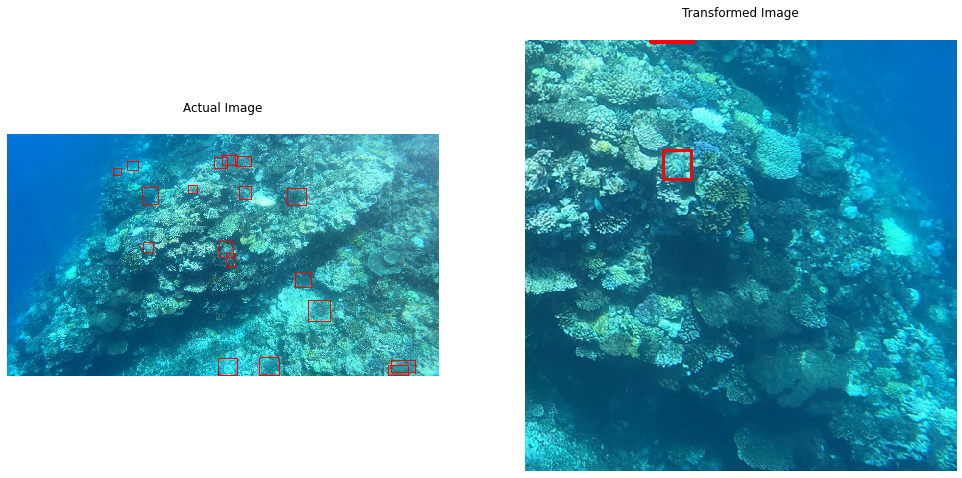

In [25]:
# changing coco to voc format for plotting
transformed_bboxes_coco = [coco2voc(i) for i in transformed_bboxes]
transformed_bboxes_coco = np.array(transformed_bboxes_coco, dtype='int')

# Creating images with bboxes to plot
trans_img_with_bb = get_image_with_bb(transformed_image, transformed_bboxes_coco)
comparison(image_with_bb, trans_img_with_bb)

As you can see there were orignally 18 bounding boxes but the transformed_img has only 4 and at the correct spots, Albumentations transforms bounding boxes with the image so it always remain glued at its orignal place!

### How Data Augmentation can improve results

We saw about how we can do augmentation to add more data & variation, but sometimes we can use the color correction and these transformation to our benifit, this example will exactly show what I am saying:

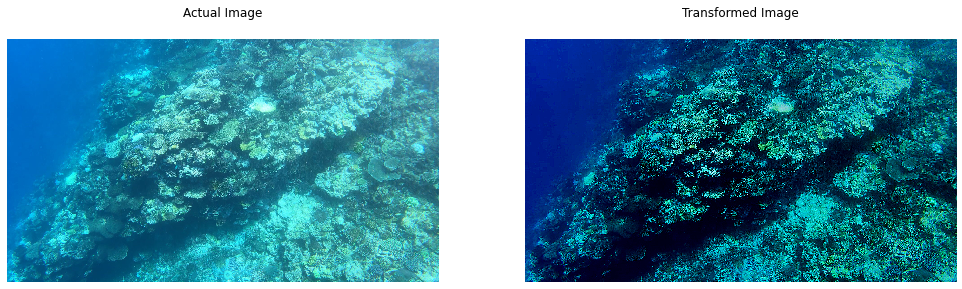

In [26]:
transform = A.Compose([
    A.RandomBrightnessContrast(contrast_limit=(0.3, 0.3), brightness_limit=(-0.4, -0.4), p=1.),
    A.HueSaturationValue(hue_shift_limit=(1, 1), p=1.),
    A.Sharpen(p=1.)
])

transformed_img = transform(image=image)['image']
comparison(image, transformed_img)

Now, the image is much better the foggy/blury effect has gone this will help ML models to identify COTS much more easily. And this is how you can use these transformation to your advantage. Full Image:

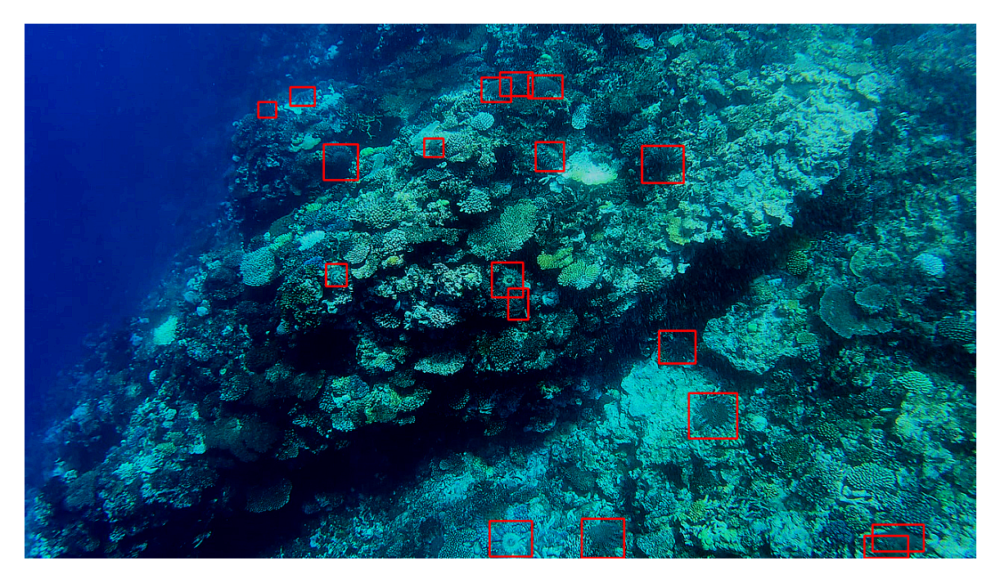

In [27]:
fig = plt.figure(figsize=(5, 4), dpi=300)
plt.imshow(get_image_with_bb(transformed_img, voc_bb))
plt.axis('off')
plt.show()

### Save and load Augmentation Pipeline

You can save and load the augmentation pipeline in Albumentations, if you print the transform it will show all the transformations we have added, and this can be easily stored in json/yaml format.

In [28]:
print(transform)

Compose([
  RandomBrightnessContrast(always_apply=False, p=1.0, brightness_limit=(-0.4, -0.4), contrast_limit=(0.3, 0.3), brightness_by_max=True),
  HueSaturationValue(always_apply=False, p=1.0, hue_shift_limit=(1, 1), sat_shift_limit=(-30, 30), val_shift_limit=(-20, 20)),
  Sharpen(always_apply=False, p=1.0, alpha=(0.2, 0.5), lightness=(0.5, 1.0)),
], p=1.0, bbox_params=None, keypoint_params=None, additional_targets={})


In [29]:
# save the augmentation pipeline,
A.save(transform, f'{BASE_DIR}/transform.json')

In [30]:
# to load it again use A.load()
loaded_transform = A.load(f'{BASE_DIR}/transform.json')
print(loaded_transform)

Compose([
  RandomBrightnessContrast(always_apply=False, p=1.0, brightness_limit=(-0.4, -0.4), contrast_limit=(0.3, 0.3), brightness_by_max=True),
  HueSaturationValue(always_apply=False, p=1.0, hue_shift_limit=(1, 1), sat_shift_limit=(-30, 30), val_shift_limit=(-20, 20)),
  Sharpen(always_apply=False, p=1.0, alpha=(0.2, 0.5), lightness=(0.5, 1.0)),
], p=1.0, bbox_params=None, keypoint_params=None, additional_targets={})


### Add Rain and Snow in Images

You can even add Rain and snow in images using Albumentations, also known as Weather augmentation. I don't know its use cases but found it very cool. Let's look at it:

In [31]:
city_img = load_img(f'{BASE_DIR}/city.jpg')
city_img.shape

(720, 1080, 3)

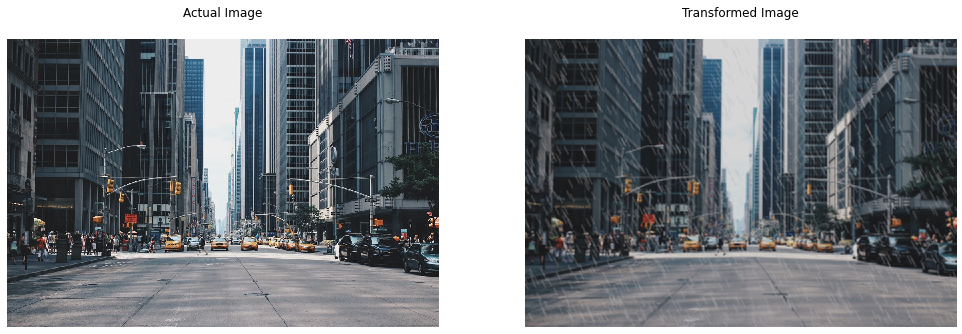

In [32]:
# Add Rain
transform = A.Compose([
    A.RandomRain(brightness_coefficient=0.9, drop_width=1, blur_value=5, p=1)
])

transformed_img = transform(image=city_img)['image']
comparison(city_img, transformed_img)

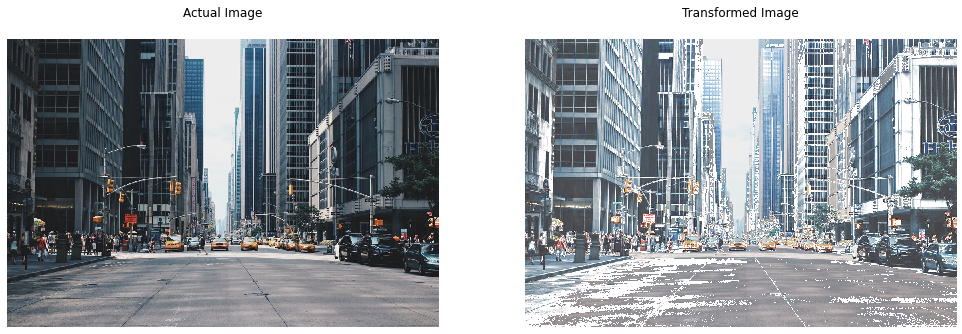

In [33]:
# Add Snow
transform = A.Compose([
    A.RandomSnow(brightness_coeff=2.5, snow_point_lower=0.3, snow_point_upper=0.5, p=1)
])

transformed_img = transform(image=city_img)['image']
comparison(city_img, transformed_img)

### Using Albumentations with Tensorflow

Reference: https://albumentations.ai/docs/examples/tensorflow-example/

In [34]:
import tensorflow as tf
import tensorflow_datasets as tfds
from functools import partial

In [35]:
data, info = tfds.load(name="tf_flowers", split="train", as_supervised=True, with_info=True)
data

2022-03-25 14:15:52.739994: W tensorflow/core/platform/cloud/google_auth_provider.cc:184] All attempts to get a Google authentication bearer token failed, returning an empty token. Retrieving token from files failed with "Not found: Could not locate the credentials file.". Retrieving token from GCE failed with "Failed precondition: Error executing an HTTP request: libcurl code 6 meaning 'Couldn't resolve host name', error details: Could not resolve host: metadata".


Dl Completed...:   0%|          | 0/5 [00:00<?, ? file/s]

Dataset tf_flowers downloaded and prepared to /root/tensorflow_datasets/tf_flowers/3.0.1. Subsequent calls will reuse this data.


2022-03-25 14:16:06.722818: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-03-25 14:16:06.723902: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-03-25 14:16:06.724654: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-03-25 14:16:06.727959: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compil

<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>

In [36]:
transform = A.Compose([
    A.Resize(120, 120),
    A.RandomBrightnessContrast(p=0.5),
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.Rotate(limit=40)
])

In [37]:
def augment_func(image):
    transformed_image = transform(image=image)['image']
    transformed_image = tf.cast(transformed_image/255., tf.float32)
    return transformed_image

def process_data(image, label, augment_func=augment_func):
    transformed_image = tf.numpy_function(augment_func, inp=[image], Tout=tf.float32)
    return transformed_image, label

In [38]:
AUTOTUNE = tf.data.experimental.AUTOTUNE

In [39]:
data_trans = data.map(partial(process_data), num_parallel_calls=AUTOTUNE).batch(30).prefetch(AUTOTUNE)
data_trans

<PrefetchDataset shapes: (<unknown>, (None,)), types: (tf.float32, tf.int64)>

2022-03-25 14:16:13.938433: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)
2022-03-25 14:16:14.073901: W tensorflow/core/kernels/data/cache_dataset_ops.cc:768] The calling iterator did not fully read the dataset being cached. In order to avoid unexpected truncation of the dataset, the partially cached contents of the dataset  will be discarded. This can happen if you have an input pipeline similar to `dataset.cache().take(k).repeat()`. You should use `dataset.take(k).cache().repeat()` instead.


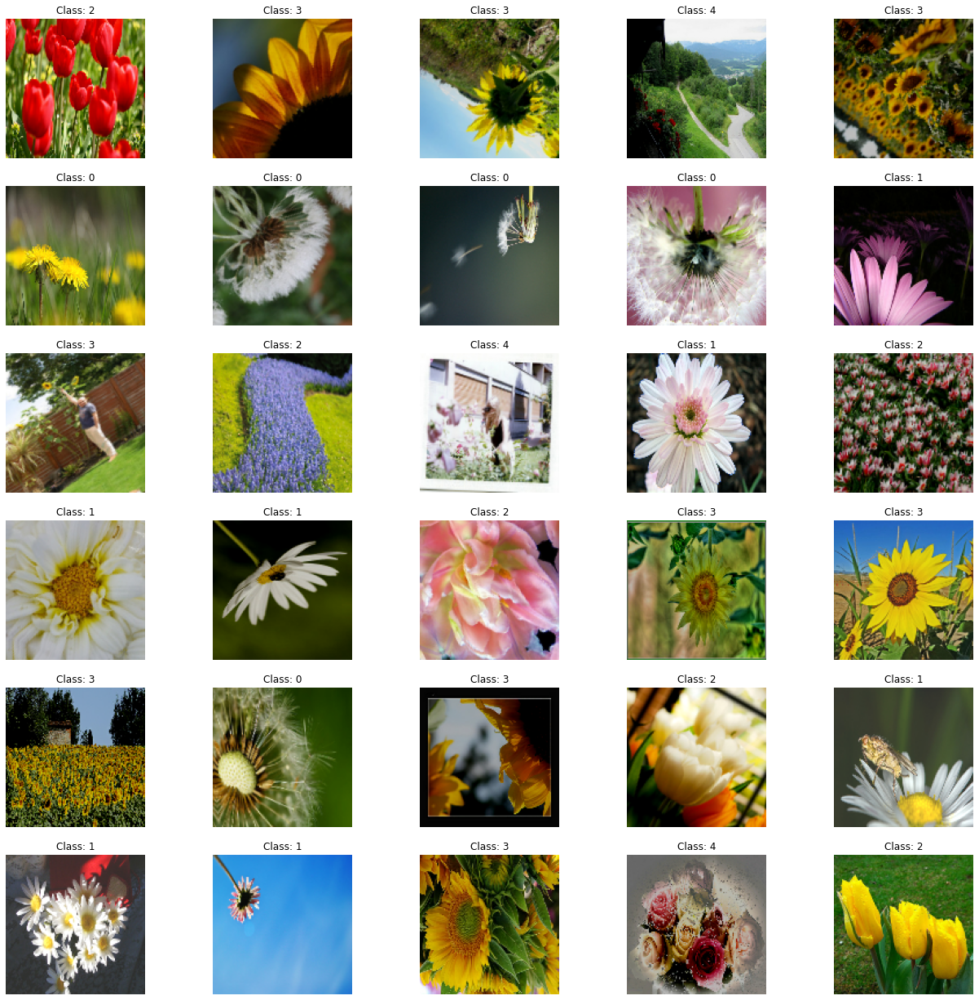

In [40]:
images, labels = next(iter(data_trans))
images, labels = images.numpy(), labels.numpy()

fig, ax = plt.subplots(6, 5, figsize=(22, 22))
c = 0
for i in range(30):
    row = i//5
    col = c%5
    ax[row, col].imshow(images[i])
    ax[row, col].axis('off')
    ax[row, col].set_title(f'Class: {labels[i]}')
    c += 1
plt.show()

Now you can use this `ds_trans` while fitting with Keras or any other custom tf model.

### General class of augmentation with TF

In [41]:
class AAugmentationTf:
    
    def __init__(self, transform, image_size, batch_size=30):
        '''
        PARAMETERS
        ----------
        
        transform   : Albumentations augmentation pipeline of type
                      'albumentations.core.composition.Compose'
                   
        image_size  : size of the target image or after augmentation
        
        batch_size  : Batch size of the output tf dataset defaults to
        (default=30)  to 30.

        '''
        self.transform = transform
        self.image_size = image_size
        self.batch_size = batch_size


    def augment(self, ds):
        '''
        PARAMETERS
        ----------
        ds: Tensorflow Dataset 'tf.data.Dataset' with
            image & labels (mandatory)
        
        RETURNS
        -------
        ds_trans: Returns a tf dataset with augmentation 
                  pipeline applied.
        '''
        
        AUTOTUNE = tf.data.experimental.AUTOTUNE
        ds_trans = ds.map(partial(self._process_data), num_parallel_calls=AUTOTUNE).prefetch(AUTOTUNE)
        ds_trans = ds_trans.map(self._set_shapes, num_parallel_calls=AUTOTUNE).\
        batch(self.batch_size).prefetch(AUTOTUNE)
        return ds_trans

        
    def _augment_func(self, image):
        transformed_image = self.transform(image=image)['image']
        transformed_image = tf.cast(transformed_image/255., tf.float32)
        return transformed_image

    
    def _process_data(self, image, label):
        transformed_image = tf.numpy_function(self._augment_func, inp=[image], Tout=tf.float32)
        return transformed_image, label

    
    def _set_shapes(self, img, label):
        img.set_shape(self.image_size)
        label.set_shape([])
        return img, label

In [42]:
transforms = A.Compose([
                A.Resize(120, 120, 3),
                A.Rotate(limit=40),
                A.RandomBrightnessContrast(brightness_limit=0.1, contrast_limit=0.2, p=0.5),
                A.ImageCompression(quality_lower=85, quality_upper=100, p=0.5),
                A.HueSaturationValue(hue_shift_limit=20, sat_shift_limit=30, val_shift_limit=20, p=0.5),
                A.HorizontalFlip(),
        ])

In [43]:
aug_tf = AAugmentationTf(transforms, (120, 120, 3)) # you can give any trasformation pipeline
ds_out = aug_tf.augment(data)                       # input your dataset to augment()
ds_out

<PrefetchDataset shapes: ((None, 120, 120, 3), (None,)), types: (tf.float32, tf.int64)>

Previously, our Dataset shape was unknown (see the output block 37)
```python
<PrefetchDataset shapes: (<unknown>, (None,)), types: (tf.float32, tf.int64)>
```

But now shape is present because I have applied `_set_shapes()` function!

In [44]:
image, label = next(iter(ds_out))
print(label)

tf.Tensor([2 3 3 4 3 0 0 0 0 1 3 2 4 1 2 1 1 2 3 3 3 0 3 2 1 1 1 3 4 2], shape=(30,), dtype=int64)


2022-03-25 14:16:19.926692: W tensorflow/core/kernels/data/cache_dataset_ops.cc:768] The calling iterator did not fully read the dataset being cached. In order to avoid unexpected truncation of the dataset, the partially cached contents of the dataset  will be discarded. This can happen if you have an input pipeline similar to `dataset.cache().take(k).repeat()`. You should use `dataset.take(k).cache().repeat()` instead.


So this was the general class for augmentation with TensorFlow. You can give any dataset and transformation pipeline you want!

I hope you liked this mini tutorial on Albumentations and its various use cases. Please upvote it to show your support!